# Install Libraries

In [1]:
!pip3 install pyroomacoustics padasip

  Preparing metadata (setup.py) ... done
  Created wheel for padasip: filename=padasip-1.2.2-py3-none-any.whl size=51649 sha256=48071e1327cd594227888a2e6f99ebf6ac7d59e36bc1e177e9ba9539305b7bdd
  Stored in directory: /Users/nathanhunsberger/Library/Caches/pip/wheels/f6/46/46/8601522508d53a322c5fda7256ffdb9a1d634a0aaac9b12efd
Successfully built padasip


In [1]:
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import scipy.io.wavfile as wav
from IPython.display import Audio
import pyroomacoustics as pra

import numpy as np
import padasip as pa

# Lil noise simulation... Doesn't really look like headphones yet lol

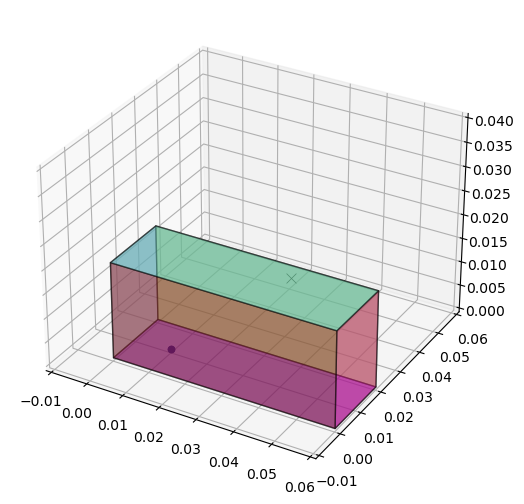

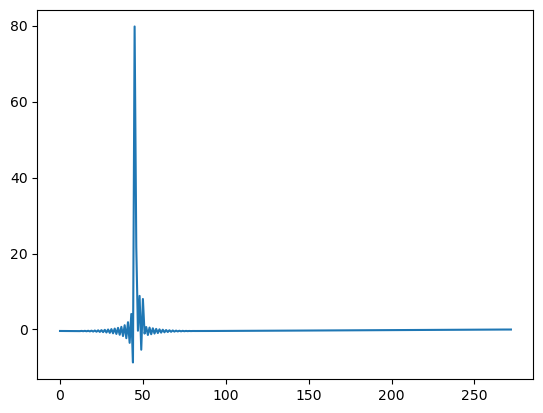

In [2]:
x = np.random.randn(999999)
fs = 48e3
m = pra.make_materials(ceiling=0.3,
                       floor=0.3,
                       east=0.8,
                       west=0.8,
                       north=0.8,
                       south=0.8,)

room_dim = [0.06, 0.02, 0.02]
room = pra.ShoeBox(room_dim, fs=fs, materials=m, air_absorption=True, ray_tracing=True)

#set_raytracing
room.add_source([0.01, 0.01, 1e-4], signal=x)
mic = np.array([0.04, 0.015, 0.02-1e-4])
room.add_microphone(mic)
fig, ax = room.plot(mic_marker_size=50)
ax.set_xlim([-0.01, 0.01 + 0.05])
ax.set_ylim([-0.01, 0.01 + 0.05])
ax.set_zlim([0, 0.04])
plt.show()

room.image_source_model()

room.compute_rir()
plt.plot(room.rir[0][0])

response = room.rir[0][0]

# Create a Simple Base Filter Class - Can be used to generate noise

In [3]:
class BaseFilter:
    def __init__(self, coefficients):
        # Coefficients is a list of weights for the filter
        self.coefficients = coefficients
        self.filterLength = len(self.coefficients)

    # Apply filter to the given noise signal
    def apply(self, noise):
        return signal.convolve(noise, self.coefficients, mode="full")

In [4]:
base = BaseFilter(list(response[0:60]/np.max(response))) # The sound stops at timestep 60

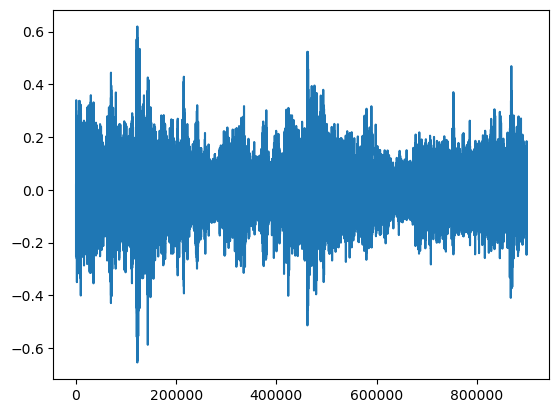

In [6]:
# Visualize sound of airplane wav
fs, coffee = wav.read("sounds/coffeeshop.wav")
coffee = coffee / np.max(np.abs(coffee))
coffee = coffee[:900000]
plt.plot(coffee)
plt.show()

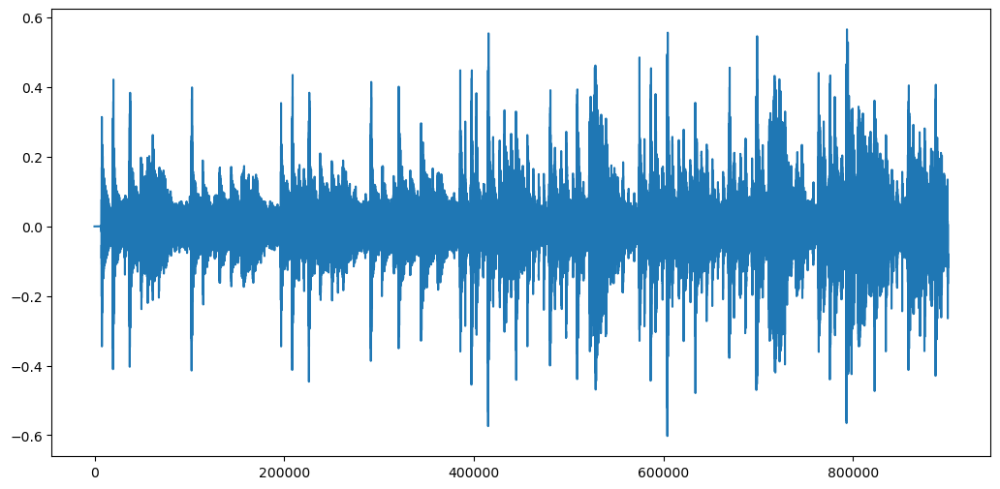

In [16]:
# Visualize sound of airplane wav
plt.figure(figsize=(12.5,6))
fs_s, song = wav.read("sounds/song.wav")
song = song / np.max(np.abs(song))
song = song[:900000]
song = song[:,1]
plt.plot(song)
plt.show()

In [19]:
Audio(noisy_song, rate=44100)

In [18]:
noisy_song = song + coffee

In [43]:
wav.write('noisy_song.wav', fs, noisy_song)

In [110]:
# 1ro Envio al parlante Ruido Blanco gaussiano y mido cuando me mide el error mic
muestras = 100000
wgn = np.random.randn(muestras)
error_mic = base.apply(wgn)
error_mic = np.reshape(error_mic, (-1,4))
wgn = np.reshape(wgn, (-1,4))
s2_estimation = pa.filters.AdaptiveFilter(model="NLMS", n=4, mu=0.1, w="random")
# Obtengo la estimacion del filtro S2
error_mic = error_mic[:len(wgn)]
print(error_mic.shape)
print(wgn.shape)
m = s2_estimation.run(wgn, error_mic)

ValueError: cannot reshape array of size 100059 into shape (4)

# Sample Simulation Iteration using Padasip NLMS filter

In [145]:
n = 10
#f = pa.filters.FilterRLS(mu=0.9, n=n)
f = pa.filters.AdaptiveFilter(model="NLMS", n=n, mu=0.05, w="random")
error = list(np.zeros(len(coffee)))
history = np.zeros(n)

for i in tqdm(range(len(coffee))):
    # measure input
    inp = coffee[i]
    history = np.append(history, inp)
    history = history[1:]
    # predict new value
    y = f.predict(history)
    # measure output
    d = inp - y
    error[i] = d
    # update filter
    #f.w += f.learning_rule(d, inp)
    if i >= n:
        f.adapt(d, inp)

  0%|          | 0/900000 [00:00<?, ?it/s]

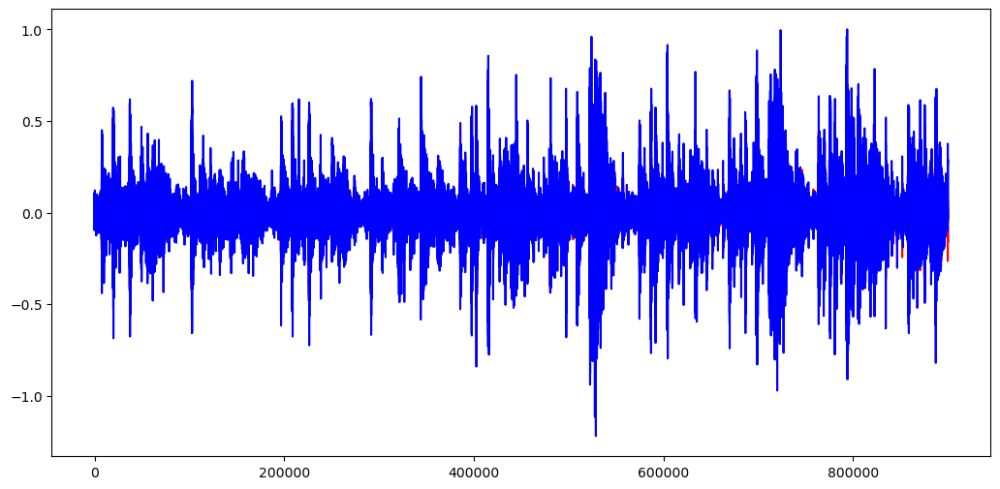

In [209]:
plt.figure(figsize=(12.5,6))
plt.plot(song, "r", label="original")
max_val = max(error)
error_plt = [v / max_val for v in error]
plt.plot(error_plt, "b", label="error")

In [204]:
Audio(error, rate=44100)

In [205]:
wav.write('noisy_cancelled_song.wav', fs, np.array(error)) # noisy_cancelled_song

In [202]:
n = 6
#f = pa.filters.FilterRLS(mu=0.9, n=n)
f = pa.filters.AdaptiveFilter(model="NLMS", n=n, mu=0.05, w="random")
error = list(np.zeros(len(noisy_song)))
history = np.zeros(n)

for i in tqdm(range(len(noisy_song))):
    # measure input
    inp = noisy_song[i]
    history = np.append(history, inp)
    history = history[1:]
    # predict new value
    y = f.predict(history)
    # measure output
    d = inp - y
    error[i] = d
    # update filter
    #f.w += f.learning_rule(song[i], inp)
    f.adapt(song[i], inp)

  0%|          | 0/900000 [00:00<?, ?it/s]

In [123]:
Audio(coffee, rate=44100)

In [156]:
Audio(error, rate=44100)

In [75]:
noisy_song_hist = pa.input_from_history(noisy_song,32)
print(noisy_song_hist)

[[ 0.01705985 -0.00183111 -0.0207831  ... -0.19400616 -0.17413862
  -0.14056825]
 [-0.00183111 -0.0207831  -0.02597125 ... -0.17413862 -0.14056825
  -0.10550249]
 [-0.0207831  -0.02597125 -0.0402234  ... -0.14056825 -0.10550249
  -0.09213538]
 ...
 [-0.09708327 -0.1091135  -0.10894778 ... -0.23782087 -0.23204106
  -0.22170807]
 [-0.1091135  -0.10894778 -0.13089968 ... -0.23204106 -0.22170807
  -0.21844245]
 [-0.10894778 -0.13089968 -0.15972627 ... -0.22170807 -0.21844245
  -0.20211767]]


In [79]:
n=32
noisy_song_hist_1 = noisy_song_hist[:-1]
song_1 = song[n:]
song_1 = np.reshape(song_1, (-1,1))
print(noisy_song_hist_1.shape)
print(song_1.shape)
#f = pa.filters.FilterRLS(mu=0.9, n=n)
f = pa.filters.AdaptiveFilter(model="NLMS", n=n, mu=.01, w="random")

y, e, w = f.run(song_1, noisy_song_hist_1)

(899968, 32)
(899968, 1)


In [ ]:
nlms_filter = pa.filters.AdaptiveFilter(model="NLMS", n=1, mu=0.1, w="random")
error = list(np.zeros(len(x)))

for i in tqdm(range(len(x))):
    # measure input
    inp = x[i]
    # predict new value
    y = s2_estimation.predict(inp)
    # measure output
    d = filtered_sound[i] + y
    error[i] = d[0]
    # update filter
    nlms_filter.adapt(inp, d)

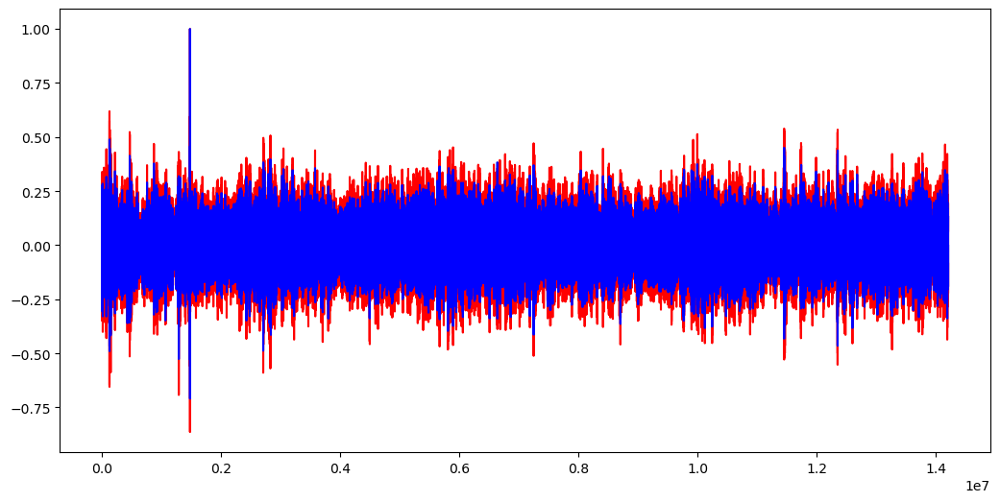

In [9]:
plt.figure(figsize=(12.5,6))
plt.plot(x, "r", label="original")
max_val = max(error)
error_plt = [v / max_val for v in error]
plt.plot(error_plt, "b", label="error")

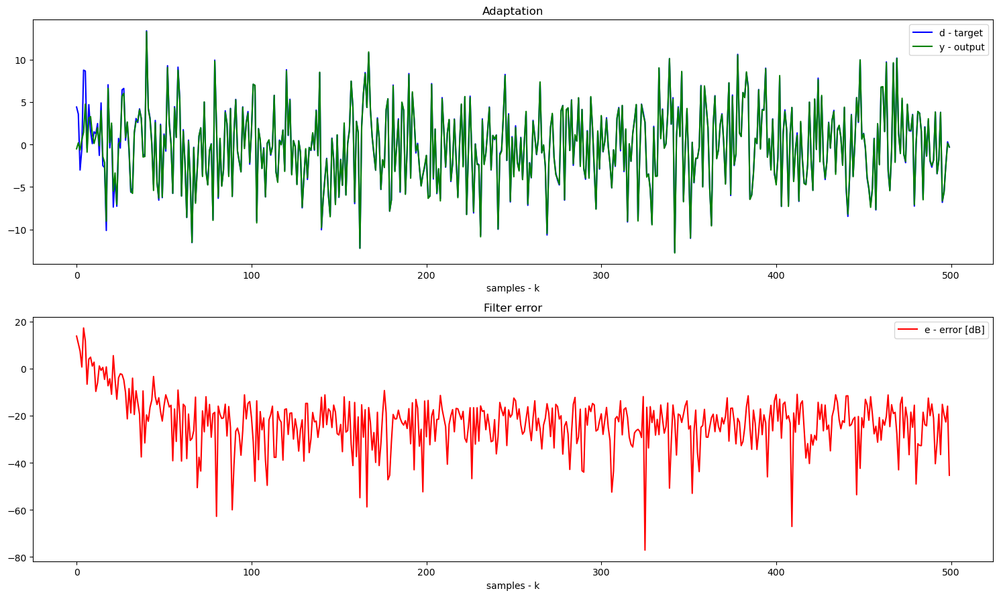

In [7]:
# https://matousc89.github.io/padasip/sources/filters/lms.html

# creation of data
N = 500
x = np.random.normal(0, 1, (N, 4)) # input matrix
v = np.random.normal(0, 0.1, N) # noise
d = 2*x[:,0] + 0.1*x[:,1] - 4*x[:,2] + 0.5*x[:,3] + v # target

# identification
f = pa.filters.FilterLMS(n=4, mu=0.1, w="random")
y, e, w = f.run(d, x)

# show results
plt.figure(figsize=(15,9))
plt.subplot(211);plt.title("Adaptation");plt.xlabel("samples - k")
plt.plot(d,"b", label="d - target")
plt.plot(y,"g", label="y - output");plt.legend()
plt.subplot(212);plt.title("Filter error");plt.xlabel("samples - k")
plt.plot(10*np.log10(e**2),"r", label="e - error [dB]");plt.legend()
plt.tight_layout()
plt.show()